#Horn Schunk

# Import Libraries

In [3]:
%%capture
!pip install pyoptflow
from matplotlib import pyplot as plt
import numpy as np
import cv2
import glob
import re
import imageio
import matplotlib.image
from math import log10, sqrt
from pyoptflow import HornSchunck
from scipy.ndimage.filters import gaussian_filter
from pyoptflow import LucasKanade, getPOI, gaussianWeight
from skimage.metrics import structural_similarity as ssim
import subprocess


In [4]:
!git clone https://github.com/richzhang/PerceptualSimilarity

Cloning into 'PerceptualSimilarity'...
remote: Enumerating objects: 778, done.
remote: Counting objects: 100% (775/775), done.
remote: Compressing objects: 100% (316/316), done.
remote: Total 778 (delta 457), reused 774 (delta 456), pack-reused 3
Receiving objects: 100% (778/778), 8.75 MiB | 12.38 MiB/s, done.
Resolving deltas: 100% (457/457), done.


# Functions

In [5]:
def U_t(frame0,frame1,t,a,b):
    y,x = np.float32(np.meshgrid(np.arange(frame0.shape[1]),np.arange(frame0.shape[0])))
    # co-ord of U_t
    x1,y1 = np.round(np.float32(x+t*a)).astype("uint32"),np.round(np.float32(y+t*b)).astype("uint32")

    U_x = np.zeros(frame0.shape, dtype = np.float32)
    tmp_x = np.zeros(frame0.shape, dtype = np.float32)
    U_y = np.zeros(frame0.shape, dtype = np.float32)
    tmp_y = np.zeros(frame0.shape, dtype = np.float32)

    # Occlusion mask
    O0= np.zeros(frame0.shape)
    O1 = np.ones(frame0.shape)


    for i in range(frame0.shape[0]):
      for j in range(frame0.shape[1]):

######################Creating U_x########################
        k,l = min(x1[i,j],frame1.shape[0]-1),min(y1[i,j],frame1.shape[1]-1)

        O1[k,l] = 0
        diff = abs(frame0[i,j] - frame1[k,l])
        # If U_x not updated
        if not U_x[k,l]:
          U_x[k,l] = a[i,j]
          tmp_x[k,l] = diff
        else:
        # If U_x already updated
          if diff<tmp_x[k,l]:
            tmp_x[k,l] = diff
            U_x[k,l] = a[i,j]

#######################Creating U_y########################
        m,n = min(x1[i,j],frame1.shape[0]-1),min(y1[i,j],frame1.shape[1]-1)

        diff2 = abs(frame0[i,j] - frame1[m,n])
        if not U_y[m,n]:
          U_y[m,n] = b[i,j]
          tmp_y[m,n] = diff2
        else:
          if diff2<tmp_y[m,n]:
            tmp_y[m,n] = diff2
            U_y[m,n] = b[i,j]

#Creating occlusion mask
################### Creating O0 ########################

    for i in range(frame0.shape[0]):
      for j in range(frame0.shape[1]):
        k,l = min(x1[i,j],frame1.shape[0]-1),min(y1[i,j],frame1.shape[1]-1)
        if abs(((a[i,j] - U_x[k,l])**2+(b[i,j] - U_y[k,l])**2)**0.5)>0.5:
          O0[i,j]=1
        else:
          O0[i,j]=0

    return U_x, U_y, O0, O1


def downsample(im,scale):
  im = im[::scale, ::scale]
  return im

def image_warping(frame0,a,b):
    x,y=np.float32(np.meshgrid(np.arange(frame0.shape[1]),np.arange(frame0.shape[0])))
    x1,y1=np.float32(x+a),np.float32(y+b)
    warped_image=cv2.remap(frame0,x1,y1,interpolation=cv2.INTER_CUBIC)
    return warped_image


def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

def plot_print(f1,f3,f_ground,wr):

  print("Reconstructing Frame using Forward Optical Flow\n")
  fig, axs = plt.subplots(1, 3, figsize=(12, 6))
  fig.subplots_adjust(hspace=.5, wspace=.001)
  axs[0].imshow(f_ground)
  axs[0].set_title(f"Ground truth Frame")
  axs[1].imshow(wr)
  axs[1].set_title(f"Predicted Frame")
  axs[2].imshow(np.abs(wr - f_ground))
  axs[2].set_title(f"Absolute Error {np.mean(np.abs(f_ground - wr)*255):.3g}")
  fig.tight_layout()
  plt.show()
  print('PSNR bw predicted and actual frame is {}'.format(PSNR(f_ground, wr)))
  matplotlib.image.imsave("org.png", f_ground)
  if np.any(wr > 1):
    wr = wr / np.max(wr)  # Normalize 'wr' element-wise
  wr = np.clip(wr, 0, 1)
  matplotlib.image.imsave("temp.png", wr)
  command = ["python", "/content/PerceptualSimilarity/lpips_2imgs.py", "-p0", "org.png", "-p1", "temp.png"]
  output = subprocess.check_output(command, universal_newlines=True, stderr=subprocess.DEVNULL)
  idx = output.find("Distance:")
  print(f"lpips bw predicted and actual frame is: {output[idx:]}")
  print("\n")
  return

def get_step4(u_t,t):
    y,x = np.float32(np.meshgrid(np.arange(u_t.shape[1]),np.arange(u_t.shape[0])))
    x = x - t*u_t
    y = y - t*u_t
    return x,y

def reconstruction(frame0,frame1,u_tx,u_ty,t,dilation_O0,dilation_O1):
    X0_x,X0_y = np.uint(get_step4(u_tx,t)[0]), np.uint(get_step4(u_tx,t)[1])
    X1_x,X1_y = np.uint(get_step4(u_ty,t-1)[0]), np.uint(get_step4(u_ty,t-1)[1])
    R = np.zeros(frame0.shape)

    for i in range(R.shape[0]):
      for j in range(R.shape[1]):
        x0,y0=min(X0_x[i,j],frame0.shape[0]-1),min(X0_y[i,j],frame0.shape[1]-1)
        x1,y1=min(X1_x[i,j],frame1.shape[0]-1),min(X1_y[i,j],frame1.shape[1]-1)

        if dilation_O1[x1,y1]==1:
          R[i,j] = frame0[x0,y0]
        elif dilation_O1[x1,y1]==0 and dilation_O0[x0,y0]==1:
          R[i,j] = frame1[x1,y1]
        else:
          R[i,j] = (1-t)*frame0[x0,y0] + (t)*frame1[x1,y1]

    return R


def Interpolated_Frame(frame0, frame1, t):
    frame0_=np.dot(frame0,[0.2989,0.5870,0.1140])
    frame1_=np.dot(frame1,[0.2989,0.5870,0.1140])
    U, V = HornSchunck(frame0_, frame1_, alpha=1, Niter=100)                  #Forward Flow
    # Creating Mask O1
    u_tx,u_ty,O0,O1= U_t(frame0_,frame1_,t,U,V)
    # Creating Mask O0
    O1 = (O1).astype("uint8")
    O0 = (O0).astype("uint8")
    kernel = np.ones((3,3),np.uint8)
    dilation_O1 = cv2.dilate(O1,kernel,iterations = 1)
    dilation_O0 = cv2.dilate(O0,kernel,iterations = 1)

    return reconstruction(frame0,frame1,u_tx,u_ty,t,dilation_O0,dilation_O1)


def Multi_Interpolated1(frame0, frame1, t, U, V):
    frame0_=np.dot(frame0,[0.2989,0.5870,0.1140])
    frame1_=np.dot(frame1,[0.2989,0.5870,0.1140])
    # Creating Mask O1
    u_tx,u_ty,O0,O1= U_t(frame0_,frame1_,t,U,V)
    # Creating Mask O0
    O1 = (O1).astype("uint8")
    O0 = (O0).astype("uint8")
    kernel = np.ones((3,3),np.uint8)
    dilation_O1 = cv2.dilate(O1,kernel,iterations = 1)
    dilation_O0 = cv2.dilate(O0,kernel,iterations = 1)

    return reconstruction(frame0,frame1,u_tx,u_ty,t,dilation_O0,dilation_O1)


##Imageio

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = "/content/drive/Shareddrives/Colab/DVPA_Assignment/A1-DVPA/00001/rgb/*.png"
flist = glob.glob(path)
flist.sort(key=lambda f: int(re.sub("\D", "", f)))
i=0
fn1 = flist[i]
im1 = imageio.imread(fn1)/255
fn2 = flist[i + 1]
im2 = imageio.imread(fn2)/255
fn3 = flist[i + 2]
im3 = imageio.imread(fn3)/255
fn4 = flist[i + 3]
im4 = imageio.imread(fn4)/255
fn5 = flist[i + 4]
im5 = imageio.imread(fn5)/255

# MultiScale Flow

f( x+a', y+b', t) = f( x, y, t+1)
means i can construct frame 2 from frame 1
:
therefore, a',b' is backward flow that HS Method gives.

In [7]:
def OF_upperlevel(f1,f2, U,V):
  wr = image_warping(f2, U, V)
  if len(f1.shape)!=2:
    f1_=np.dot(f1,[0.2989,0.5870,0.1140])
    wr_=np.dot(wr,[0.2989,0.5870,0.1140])
  U_, V_ = HornSchunck(f1_, wr_, alpha=1, Niter=100)
  U_new, V_new = U+U_, V+V_
  return U_new, V_new

def gray(IMG):
  return np.dot(IMG,[0.2989,0.5870,0.1140])

def MultiScaleOF(f1,f2,scale):
  if scale==1:
    if len(f1.shape)!=2:
      f1_=np.dot(f1,[0.2989,0.5870,0.1140])
      f2_=np.dot(f2,[0.2989,0.5870,0.1140])
    return HornSchunck(f1_, f2_, alpha=1, Niter=100)

  u,v = MultiScaleOF(downsample(f1,2),downsample(f2,2),scale//2)
  U = cv2.resize(2*u, None, fx=2, fy=2, interpolation=cv2.INTER_LINEAR)
  V = cv2.resize(2*v, None, fx=2, fy=2, interpolation=cv2.INTER_LINEAR)

  U_new,V_new = OF_upperlevel(f1,f2, U,V)
  return U_new,V_new


# 00001

## Q1


Reconstructing Frame 2, K=2

SCALE=1
Reconstructing Frame using Forward Optical Flow



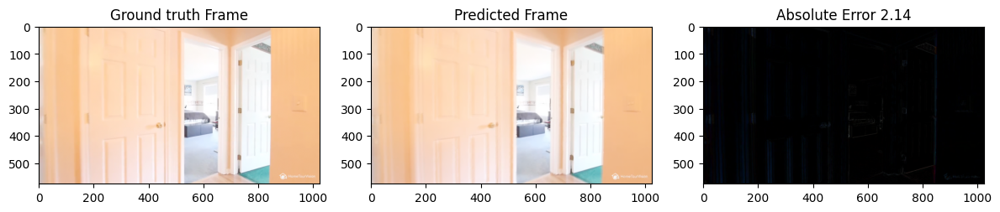

PSNR bw predicted and actual frame is 83.18756809366279
lpips bw predicted and actual frame is: Distance: 0.077



SCALE=2
Reconstructing Frame using Forward Optical Flow



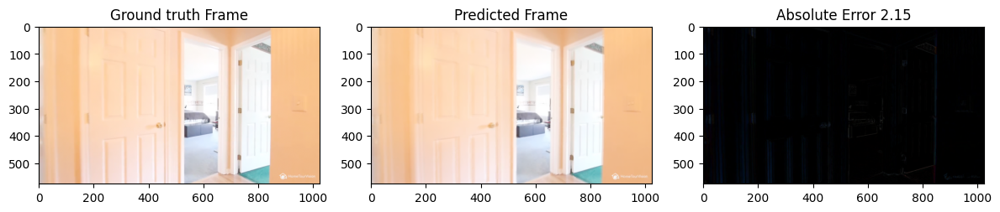

PSNR bw predicted and actual frame is 83.25580185580401
lpips bw predicted and actual frame is: Distance: 0.076



SCALE=4
Reconstructing Frame using Forward Optical Flow



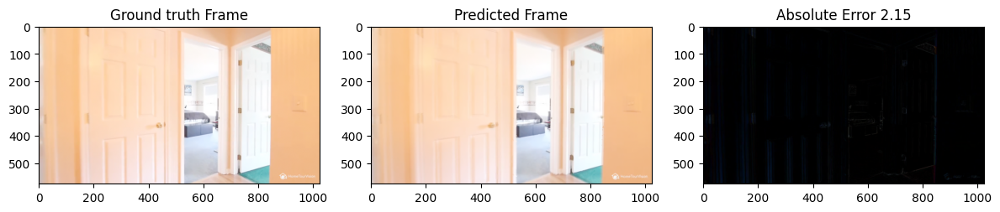

PSNR bw predicted and actual frame is 83.21939229838947
lpips bw predicted and actual frame is: Distance: 0.080



SCALE=8
Reconstructing Frame using Forward Optical Flow



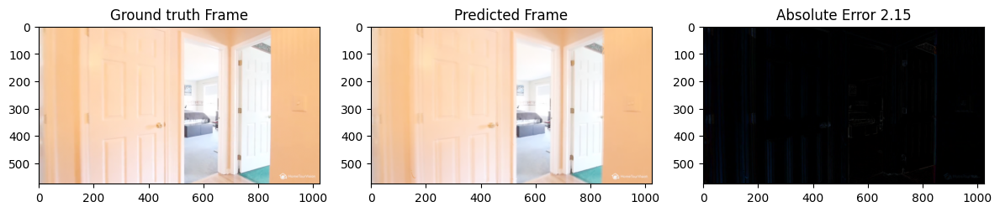

PSNR bw predicted and actual frame is 83.19897752446127
lpips bw predicted and actual frame is: Distance: 0.082





In [28]:
print("SCALE=1")
aa,bb = MultiScaleOF(im1,im3,scale=1)
R = Multi_Interpolated1(im1,im3,0.5,aa,bb)
plot_print(im1, im3, im2, R)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("SCALE=2")
aa,bb = MultiScaleOF(im1,im3,scale=2)
R = Multi_Interpolated1(im1,im3,0.5,aa,bb)
plot_print(im1, im3, im2, R)                # frame, nxt_frame, interpolated frame (GT), Calculated
print("SCALE=4")
aa,bb = MultiScaleOF(im1,im3,scale=4)
R = Multi_Interpolated1(im1,im3,0.5,aa,bb)
plot_print(im1, im3, im2, R)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("SCALE=8")
aa,bb = MultiScaleOF(im1,im3,scale=8)
R = Multi_Interpolated1(im1,im3,0.5,aa,bb)
plot_print(im1, im3, im2, R)              # frame, nxt_frame, interpolated frame (GT), Calculated

## Q2


Reconstructing Frame Multiple Frames


K=2

In [ ]:
path = "/content/drive/Shareddrives/Colab/DVPA_Assignment/A1-DVPA/00001/rgb/*.png"
flist = glob.glob(path)
flist.sort(key=lambda f: int(re.sub("\D", "", f)))
i=0
fn1 = flist[i]
im1 = imageio.imread(fn1)/255
fn2 = flist[i + 1]
im2 = imageio.imread(fn2)/255
fn3 = flist[i + 2]
im3 = imageio.imread(fn3)/255
fn4 = flist[i + 3]
im4 = imageio.imread(fn4)/255
fn5 = flist[i + 4]
im5 = imageio.imread(fn5)/255

SCALE=1
Reconstructing Frame using Forward Optical Flow



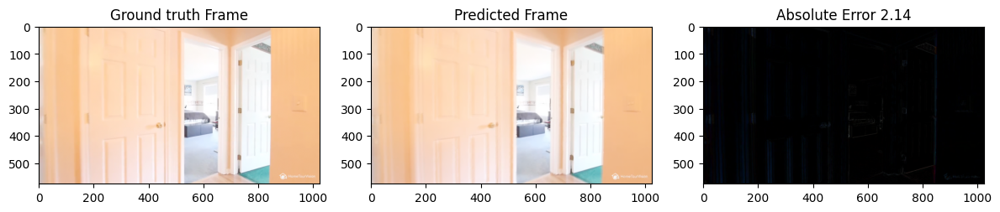

PSNR bw predicted and actual frame is 83.18756809366279
lpips bw predicted and actual frame is: Distance: 0.077



SCALE=2
Reconstructing Frame using Forward Optical Flow



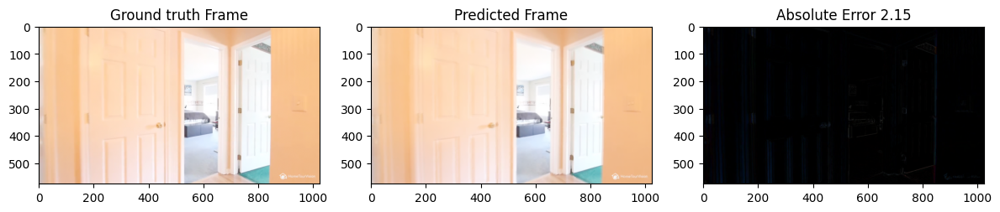

PSNR bw predicted and actual frame is 83.25580185580401
lpips bw predicted and actual frame is: Distance: 0.076



SCALE=4
Reconstructing Frame using Forward Optical Flow



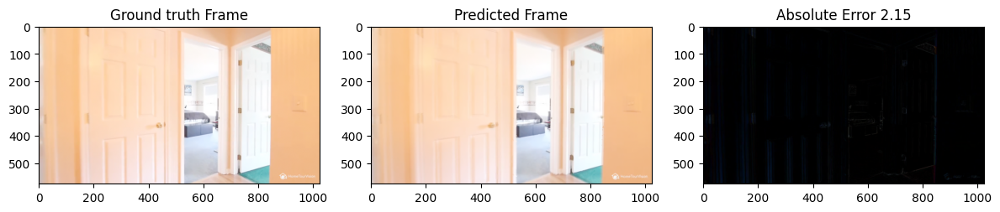

PSNR bw predicted and actual frame is 83.21939229838947
lpips bw predicted and actual frame is: Distance: 0.080



SCALE=8
Reconstructing Frame using Forward Optical Flow



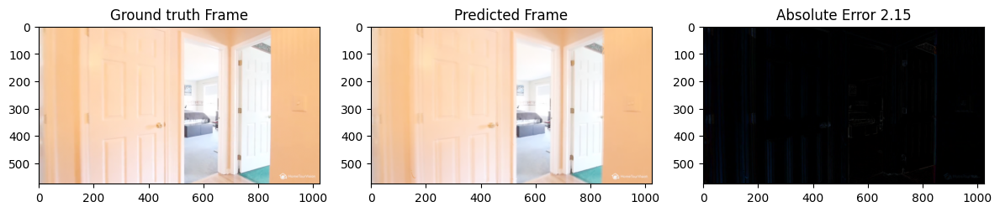

PSNR bw predicted and actual frame is 83.19897752446127
lpips bw predicted and actual frame is: Distance: 0.082





In [ ]:
print("SCALE=1")
aa,bb = MultiScaleOF(im1,im3,scale=1)
R = Multi_Interpolated1(im1,im3,0.5,aa,bb)
plot_print(im1, im3, im2, R)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("SCALE=2")
aa,bb = MultiScaleOF(im1,im3,scale=2)
R = Multi_Interpolated1(im1,im3,0.5,aa,bb)
plot_print(im1, im3, im2, R)                # frame, nxt_frame, interpolated frame (GT), Calculated
print("SCALE=4")
aa,bb = MultiScaleOF(im1,im3,scale=4)
R = Multi_Interpolated1(im1,im3,0.5,aa,bb)
plot_print(im1, im3, im2, R)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("SCALE=8")
aa,bb = MultiScaleOF(im1,im3,scale=8)
R = Multi_Interpolated1(im1,im3,0.5,aa,bb)
plot_print(im1, im3, im2, R)              # frame, nxt_frame, interpolated frame (GT), Calculated

K=3

SCALE=1
Frame 2 reconstruction
Reconstructing Frame using Forward Optical Flow



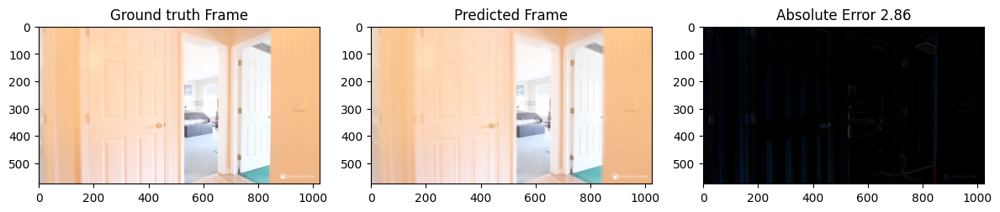

PSNR bw predicted and actual frame is 80.73725209085863
lpips bw predicted and actual frame is: Distance: 0.073



Frame 3 reconstruction
Reconstructing Frame using Forward Optical Flow



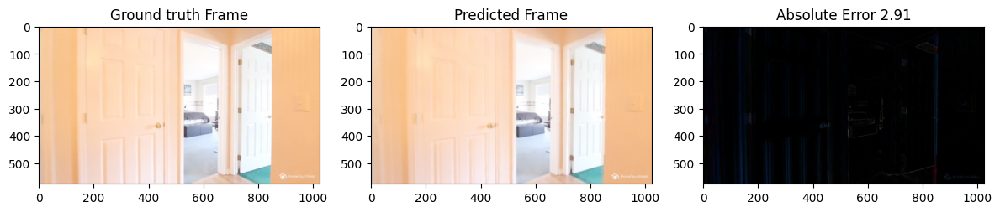

PSNR bw predicted and actual frame is 80.7085033000088
lpips bw predicted and actual frame is: Distance: 0.074



SCALE=2
Frame 2 reconstruction
Reconstructing Frame using Forward Optical Flow



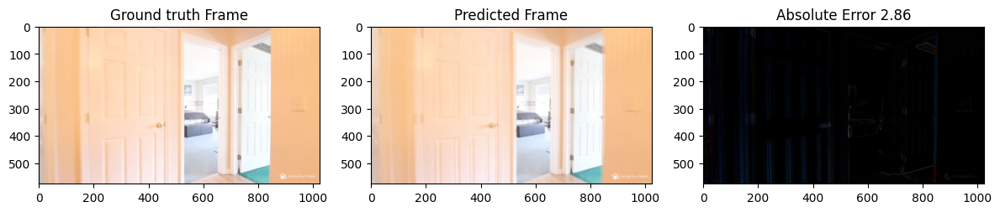

PSNR bw predicted and actual frame is 80.76460682050877
lpips bw predicted and actual frame is: Distance: 0.073



Frame 3 reconstruction
Reconstructing Frame using Forward Optical Flow



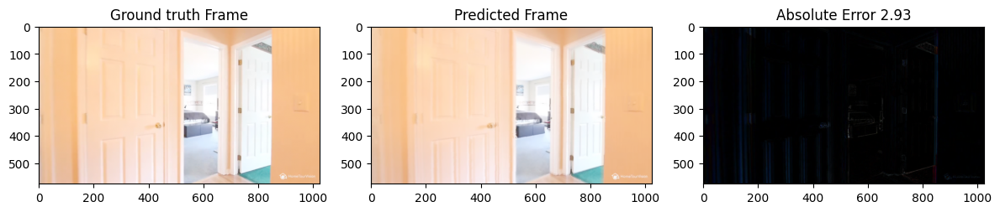

PSNR bw predicted and actual frame is 80.6869500804805
lpips bw predicted and actual frame is: Distance: 0.075



SCALE=4
Frame 2 reconstruction
Reconstructing Frame using Forward Optical Flow



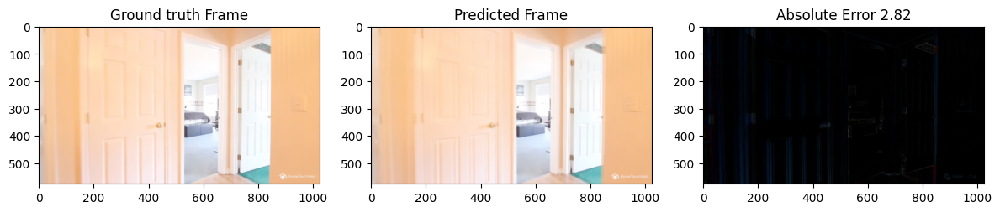

PSNR bw predicted and actual frame is 80.93983534880792
lpips bw predicted and actual frame is: Distance: 0.074



Frame 3 reconstruction
Reconstructing Frame using Forward Optical Flow



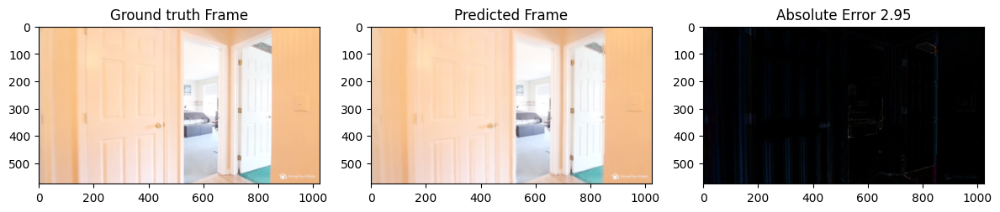

PSNR bw predicted and actual frame is 80.56875831270386
lpips bw predicted and actual frame is: Distance: 0.083



SCALE=8
Frame 2 reconstruction
Reconstructing Frame using Forward Optical Flow



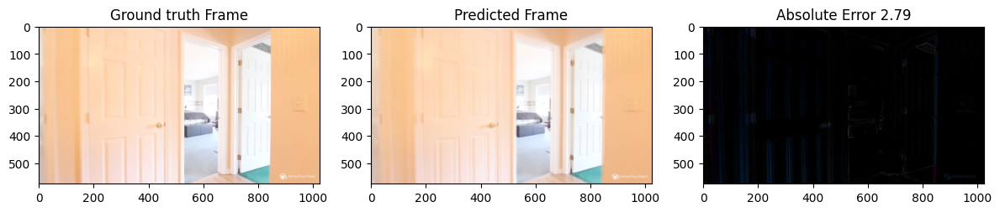

PSNR bw predicted and actual frame is 81.0044484201167
lpips bw predicted and actual frame is: Distance: 0.078



Frame 3 reconstruction
Reconstructing Frame using Forward Optical Flow



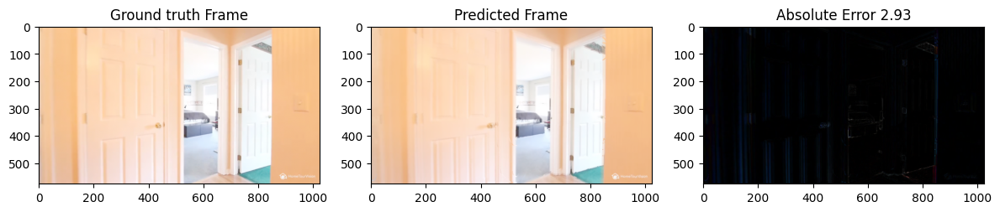

PSNR bw predicted and actual frame is 80.589445110612
lpips bw predicted and actual frame is: Distance: 0.087





In [36]:
print("SCALE=1")
aa,bb = HornSchunck(gray(im1), gray(im4), alpha=1, Niter=100)
R2 = Multi_Interpolated1(im1,im4,1/3,aa,bb)
R3 = Multi_Interpolated1(im1,im4,2/3,aa,bb)
print("Frame 2 reconstruction")
plot_print(im1, im4, im2, R2)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 3 reconstruction")
plot_print(im1, im4, im3, R3)              # frame, nxt_frame, interpolated frame (GT), Calculated

print("SCALE=2")
aa,bb = MultiScaleOF(im1,im4,scale=2)
R2 = Multi_Interpolated1(im1,im4,1/3,aa,bb)
R3 = Multi_Interpolated1(im1,im4,2/3,aa,bb)
print("Frame 2 reconstruction")
plot_print(im1, im4, im2, R2)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 3 reconstruction")
plot_print(im1, im4, im3, R3)              # frame, nxt_frame, interpolated frame (GT), Calculated

print("SCALE=4")
aa,bb = MultiScaleOF(im1,im4,scale=4)
R2 = Multi_Interpolated1(im1,im4,1/3,aa,bb)
R3 = Multi_Interpolated1(im1,im4,2/3,aa,bb)
print("Frame 2 reconstruction")
plot_print(im1, im4, im2, R2)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 3 reconstruction")
plot_print(im1, im4, im3, R3)              # frame, nxt_frame, interpolated frame (GT), Calculated

print("SCALE=8")
aa,bb = MultiScaleOF(im1,im4,scale=8)
R2 = Multi_Interpolated1(im1,im4,1/3,aa,bb)
R3 = Multi_Interpolated1(im1,im4,2/3,aa,bb)
print("Frame 2 reconstruction")
plot_print(im1, im4, im2, R2)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 3 reconstruction")
plot_print(im1, im4, im3, R3)              # frame, nxt_frame, interpolated frame (GT), Calculated

K=4

Observation: Better frame reconstruction of frame2 and frame4. bcz it its taking into account both forward flow and backward flow

SCALE=1
Frame 2 reconstruction
Reconstructing Frame using Forward Optical Flow



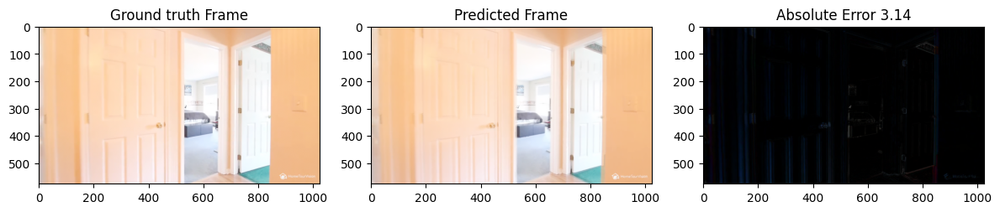

PSNR bw predicted and actual frame is 79.94872924323134
lpips bw predicted and actual frame is: Distance: 0.067



Frame 3 reconstruction
Reconstructing Frame using Forward Optical Flow



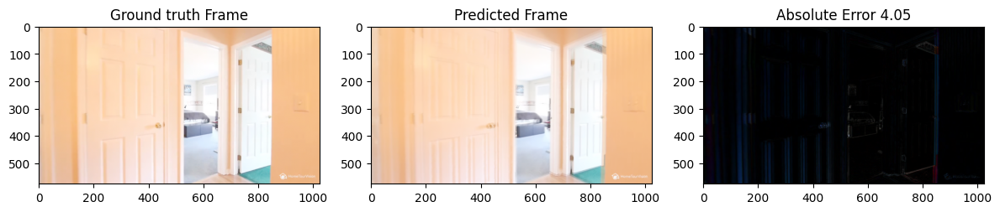

PSNR bw predicted and actual frame is 77.8854998726853
lpips bw predicted and actual frame is: Distance: 0.103



Frame 4 reconstruction
Reconstructing Frame using Forward Optical Flow



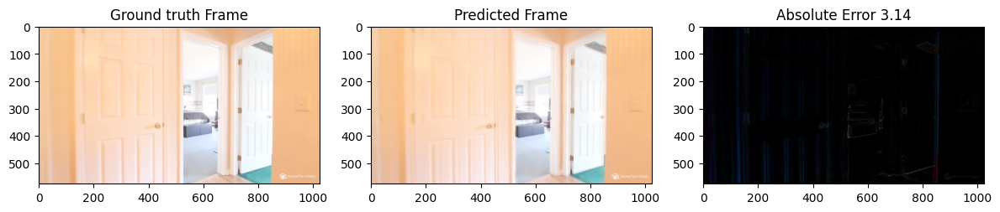

PSNR bw predicted and actual frame is 79.96222673096216
lpips bw predicted and actual frame is: Distance: 0.064



SCALE=2
Frame 2 reconstruction
Reconstructing Frame using Forward Optical Flow



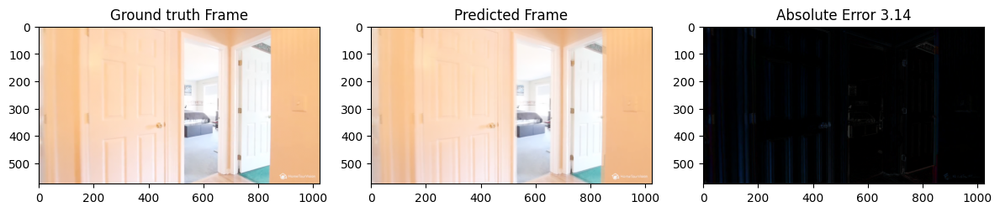

PSNR bw predicted and actual frame is 79.9747309396998
lpips bw predicted and actual frame is: Distance: 0.066



Frame 3 reconstruction
Reconstructing Frame using Forward Optical Flow



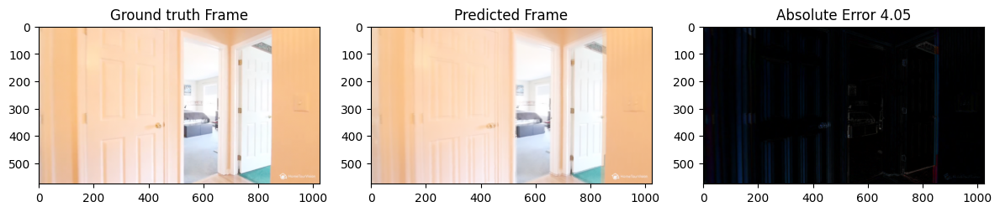

PSNR bw predicted and actual frame is 77.90282912075803
lpips bw predicted and actual frame is: Distance: 0.104



Frame 4 reconstruction
Reconstructing Frame using Forward Optical Flow



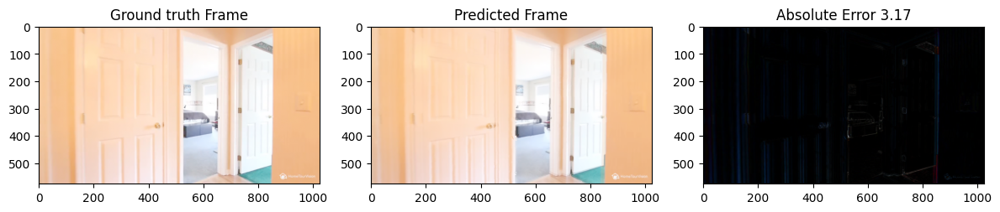

PSNR bw predicted and actual frame is 79.87198852808675
lpips bw predicted and actual frame is: Distance: 0.066



SCALE=4
Frame 2 reconstruction
Reconstructing Frame using Forward Optical Flow



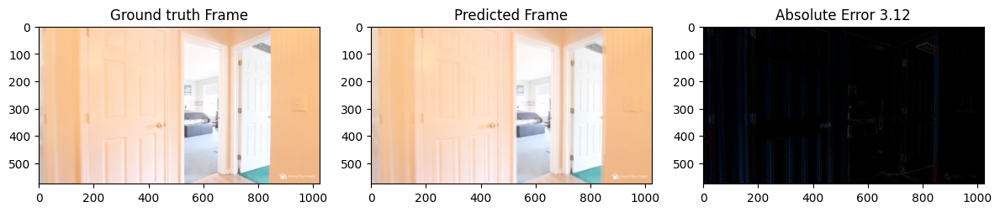

PSNR bw predicted and actual frame is 80.07224049823773
lpips bw predicted and actual frame is: Distance: 0.067



Frame 3 reconstruction
Reconstructing Frame using Forward Optical Flow



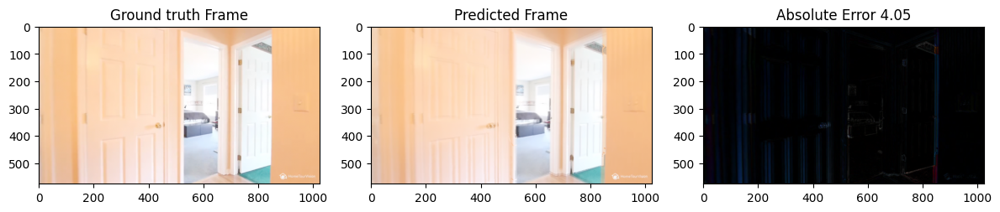

PSNR bw predicted and actual frame is 77.93908883249578
lpips bw predicted and actual frame is: Distance: 0.109



Frame 4 reconstruction
Reconstructing Frame using Forward Optical Flow



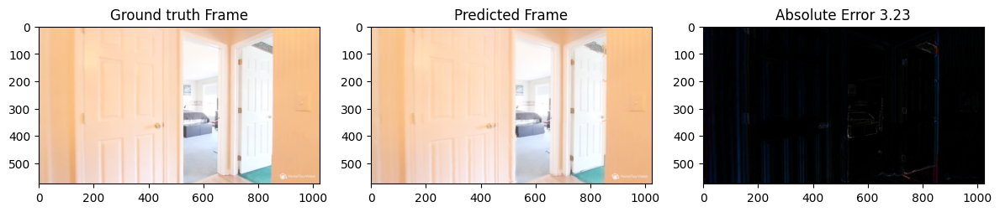

PSNR bw predicted and actual frame is 79.44397445606182
lpips bw predicted and actual frame is: Distance: 0.079





In [37]:
print("SCALE=1")
aa,bb = HornSchunck(gray(im1), gray(im5), alpha=1, Niter=100)
R2 = Multi_Interpolated1(im1,im5,0.25,aa,bb)
R3 = Multi_Interpolated1(im1,im5,0.5,aa,bb)
R4 = Multi_Interpolated1(im1,im5,0.75,aa,bb)
print("Frame 2 reconstruction")
plot_print(im1, im4, im2, R2)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 3 reconstruction")
plot_print(im1, im4, im3, R3)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 4 reconstruction")
plot_print(im1, im4, im4, R4)              # frame, nxt_frame, interpolated frame (GT), Calculated

print("SCALE=2")
aa,bb = MultiScaleOF(im1,im5,scale=2)
R2 = Multi_Interpolated1(im1,im5,0.25,aa,bb)
R3 = Multi_Interpolated1(im1,im5,0.5,aa,bb)
R4 = Multi_Interpolated1(im1,im5,0.75,aa,bb)
print("Frame 2 reconstruction")
plot_print(im1, im4, im2, R2)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 3 reconstruction")
plot_print(im1, im4, im3, R3)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 4 reconstruction")
plot_print(im1, im4, im4, R4)              # frame, nxt_frame, interpolated frame (GT), Calculated

print("SCALE=4")
aa,bb = MultiScaleOF(im1,im5,scale=4)
R2 = Multi_Interpolated1(im1,im5,0.25,aa,bb)
R3 = Multi_Interpolated1(im1,im5,0.5,aa,bb)
R4 = Multi_Interpolated1(im1,im5,0.75,aa,bb)
print("Frame 2 reconstruction")
plot_print(im1, im4, im2, R2)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 3 reconstruction")
plot_print(im1, im4, im3, R3)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 4 reconstruction")
plot_print(im1, im4, im4, R4)              # frame, nxt_frame, interpolated frame (GT), Calculated

# 00006

In [ ]:
path = "/content/drive/Shareddrives/Colab/DVPA_Assignment/A1-DVPA/00006/rgb/*.png"
flist = glob.glob(path)
flist.sort(key=lambda f: int(re.sub("\D", "", f)))
i=0
fn1 = flist[i]
im1 = imageio.imread(fn1)/255
fn2 = flist[i + 1]
im2 = imageio.imread(fn2)/255
fn3 = flist[i + 2]
im3 = imageio.imread(fn3)/255

## Q1

SCALE=1
Reconstructing Frame using Forward Optical Flow



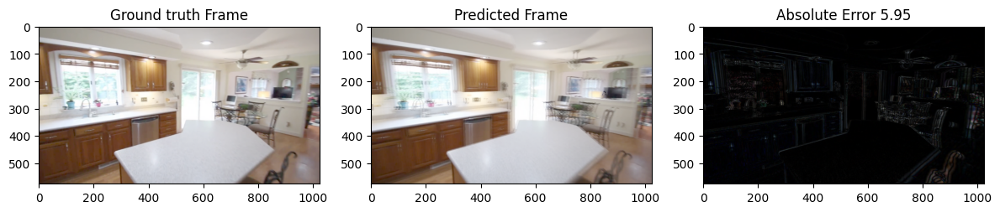

PSNR bw predicted and actual frame is 74.82265205094942
lpips bw predicted and actual frame is: Distance: 0.110



SCALE=2
Reconstructing Frame using Forward Optical Flow



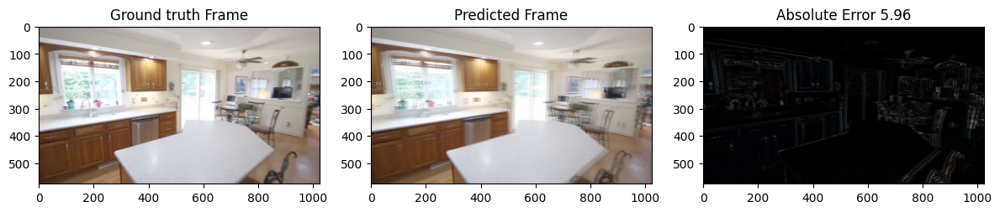

PSNR bw predicted and actual frame is 74.71213188331416
lpips bw predicted and actual frame is: Distance: 0.124



SCALE=4
Reconstructing Frame using Forward Optical Flow



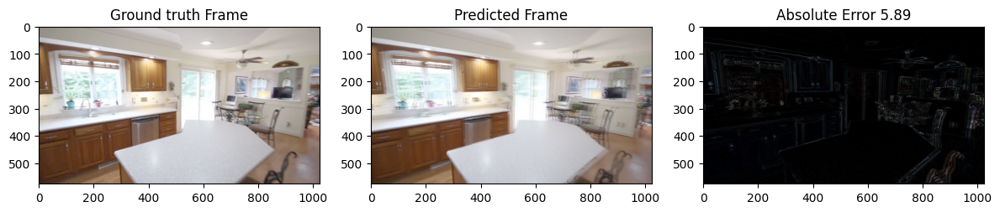

PSNR bw predicted and actual frame is 74.77341542692061
lpips bw predicted and actual frame is: Distance: 0.143



SCALE=8
Reconstructing Frame using Forward Optical Flow



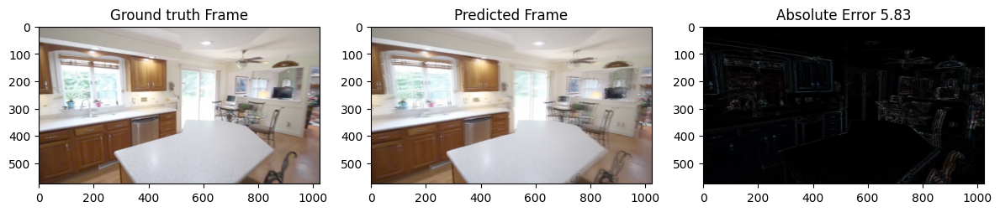

PSNR bw predicted and actual frame is 74.72981111832891
lpips bw predicted and actual frame is: Distance: 0.155





In [ ]:
# K=2
print("SCALE=1")
aa,bb = MultiScaleOF(im1,im3,scale=1)
R = Multi_Interpolated1(im1,im3,0.5,aa,bb)
plot_print(im1, im3, im2, R)                # frame, nxt_frame, interpolated frame (GT), Calculated
print("SCALE=2")
aa,bb = MultiScaleOF(im1,im3,scale=2)
R = Multi_Interpolated1(im1,im3,0.5,aa,bb)
plot_print(im1, im3, im2, R)                # frame, nxt_frame, interpolated frame (GT), Calculated
print("SCALE=4")
aa,bb = MultiScaleOF(im1,im3,scale=4)
R = Multi_Interpolated1(im1,im3,0.5,aa,bb)
plot_print(im1, im3, im2, R)                # frame, nxt_frame, interpolated frame (GT), Calculated
print("SCALE=8")
aa,bb = MultiScaleOF(im1,im3,scale=8)
R = Multi_Interpolated1(im1,im3,0.5,aa,bb)
plot_print(im1, im3, im2, R)                # frame, nxt_frame, interpolated frame (GT), Calculated

## Q2

SCALE=1
Frame 2 reconstruction
Reconstructing Frame using Forward Optical Flow



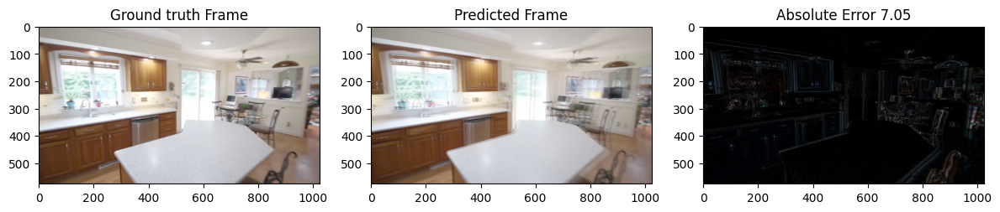

PSNR bw predicted and actual frame is 73.59696724748395
lpips bw predicted and actual frame is: Distance: 0.115



Frame 3 reconstruction
Reconstructing Frame using Forward Optical Flow



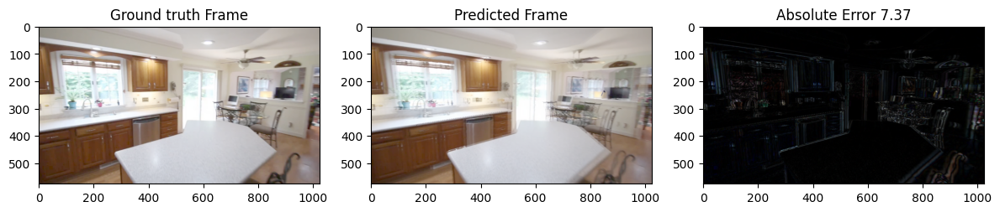

PSNR bw predicted and actual frame is 73.09500983724236
lpips bw predicted and actual frame is: Distance: 0.138



SCALE=2
Frame 2 reconstruction
Reconstructing Frame using Forward Optical Flow



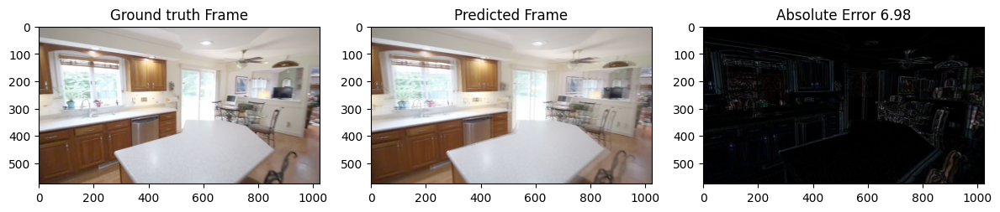

PSNR bw predicted and actual frame is 73.65426718026549
lpips bw predicted and actual frame is: Distance: 0.117



Frame 3 reconstruction
Reconstructing Frame using Forward Optical Flow



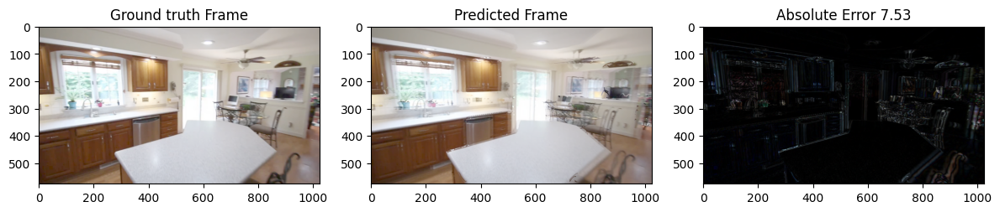

PSNR bw predicted and actual frame is 72.72922112722473
lpips bw predicted and actual frame is: Distance: 0.168



SCALE=4
Frame 2 reconstruction
Reconstructing Frame using Forward Optical Flow



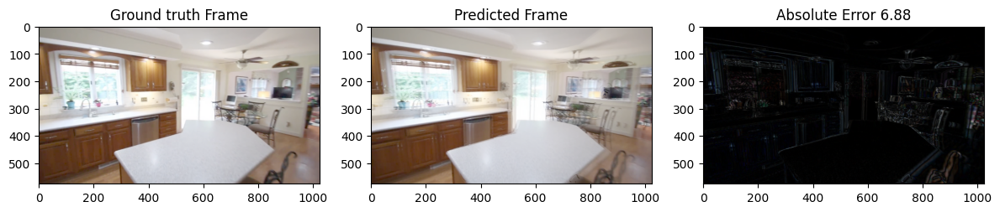

PSNR bw predicted and actual frame is 73.67623340487424
lpips bw predicted and actual frame is: Distance: 0.127



Frame 3 reconstruction
Reconstructing Frame using Forward Optical Flow



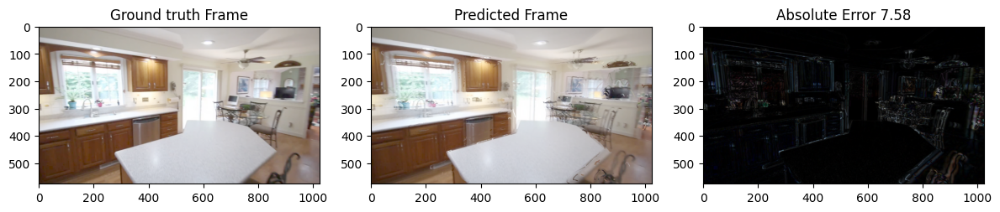

PSNR bw predicted and actual frame is 72.62148830241412
lpips bw predicted and actual frame is: Distance: 0.200





In [ ]:
# K=3
print("SCALE=1")
aa,bb = HornSchunck(gray(im1), gray(im4), alpha=1, Niter=100)
R2 = Multi_Interpolated1(im1,im4,1/3,aa,bb)
R3 = Multi_Interpolated1(im1,im4,2/3,aa,bb)
print("Frame 2 reconstruction")
plot_print(im1, im4, im2, R2)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 3 reconstruction")
plot_print(im1, im4, im3, R3)              # frame, nxt_frame, interpolated frame (GT), Calculated

print("SCALE=2")
aa,bb = MultiScaleOF(im1,im4,scale=2)
R2 = Multi_Interpolated1(im1,im4,1/3,aa,bb)
R3 = Multi_Interpolated1(im1,im4,2/3,aa,bb)
print("Frame 2 reconstruction")
plot_print(im1, im4, im2, R2)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 3 reconstruction")
plot_print(im1, im4, im3, R3)              # frame, nxt_frame, interpolated frame (GT), Calculated

print("SCALE=4")
aa,bb = MultiScaleOF(im1,im4,scale=4)
R2 = Multi_Interpolated1(im1,im4,1/3,aa,bb)
R3 = Multi_Interpolated1(im1,im4,2/3,aa,bb)
print("Frame 2 reconstruction")
plot_print(im1, im4, im2, R2)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 3 reconstruction")
plot_print(im1, im4, im3, R3)              # frame, nxt_frame, interpolated frame (GT), Calculated

# print("SCALE=8")
# aa,bb = MultiScaleOF(im1,im4,scale=8)
# R2 = Multi_Interpolated1(im1,im4,1/3,aa,bb)
# R3 = Multi_Interpolated1(im1,im4,2/3,aa,bb)
# print("Frame 2 reconstruction")
# plot_print(im1, im4, im2, R2)              # frame, nxt_frame, interpolated frame (GT), Calculated
# print("Frame 3 reconstruction")
# plot_print(im1, im4, im3, R3)              # frame, nxt_frame, interpolated frame (GT), Calculated

SCALE=1
Frame 2 reconstruction
Reconstructing Frame using Forward Optical Flow



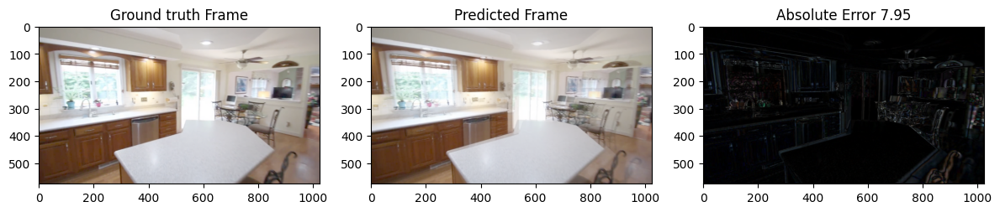

PSNR bw predicted and actual frame is 72.81742396659095
lpips bw predicted and actual frame is: Distance: 0.116



Frame 3 reconstruction
Reconstructing Frame using Forward Optical Flow



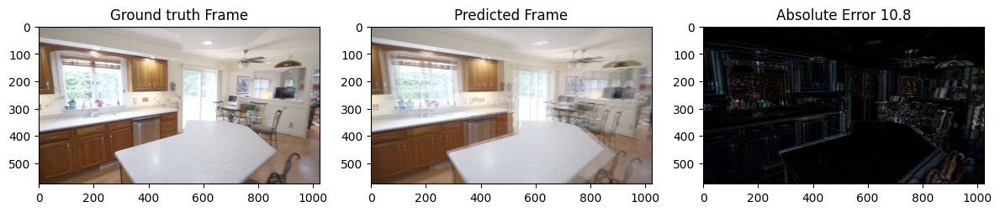

PSNR bw predicted and actual frame is 70.44007652393053
lpips bw predicted and actual frame is: Distance: 0.226



Frame 4 reconstruction
Reconstructing Frame using Forward Optical Flow



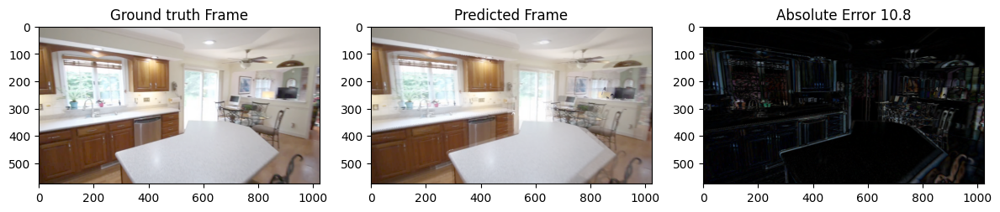

PSNR bw predicted and actual frame is 70.16679226512471
lpips bw predicted and actual frame is: Distance: 0.209



SCALE=2
Frame 2 reconstruction
Reconstructing Frame using Forward Optical Flow



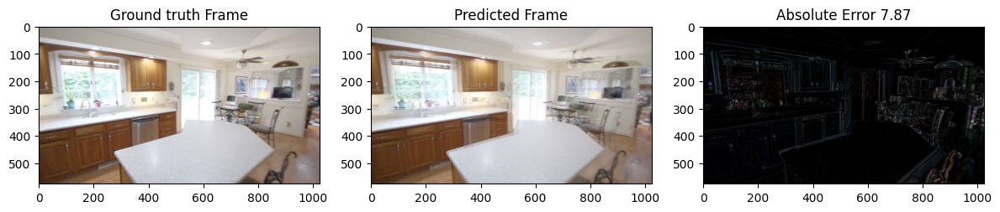

PSNR bw predicted and actual frame is 72.87147190519298
lpips bw predicted and actual frame is: Distance: 0.117



Frame 3 reconstruction
Reconstructing Frame using Forward Optical Flow



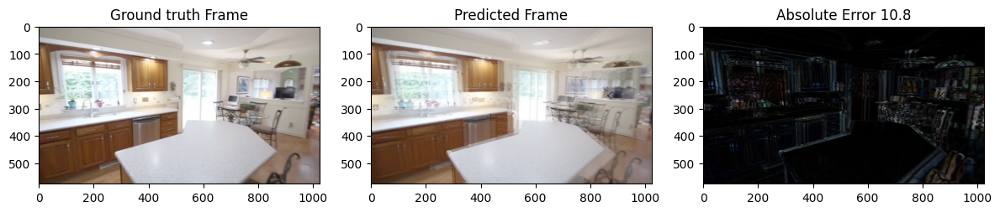

PSNR bw predicted and actual frame is 70.42386718110637
lpips bw predicted and actual frame is: Distance: 0.238



Frame 4 reconstruction
Reconstructing Frame using Forward Optical Flow



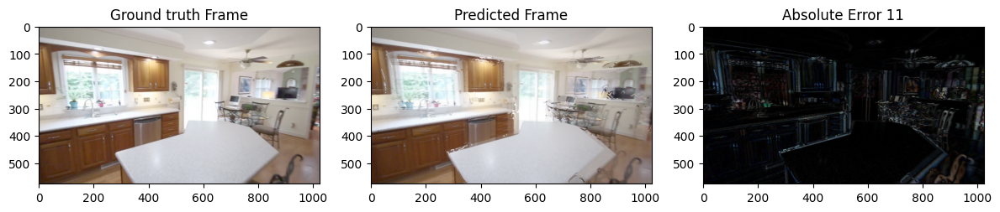

PSNR bw predicted and actual frame is 69.97958800325443
lpips bw predicted and actual frame is: Distance: 0.254



SCALE=4
Frame 2 reconstruction
Reconstructing Frame using Forward Optical Flow



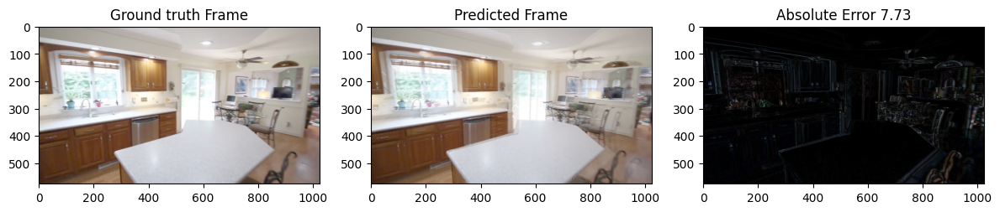

PSNR bw predicted and actual frame is 72.94575417280781
lpips bw predicted and actual frame is: Distance: 0.123



Frame 3 reconstruction
Reconstructing Frame using Forward Optical Flow



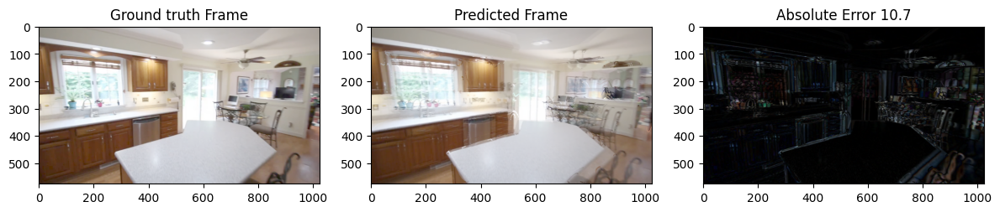

PSNR bw predicted and actual frame is 70.47710160960688
lpips bw predicted and actual frame is: Distance: 0.254



Frame 4 reconstruction
Reconstructing Frame using Forward Optical Flow



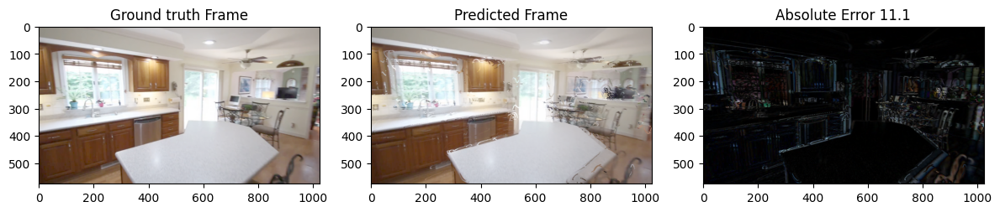

PSNR bw predicted and actual frame is 69.82357810393938
lpips bw predicted and actual frame is: Distance: 0.288





In [ ]:
# K=4
print("SCALE=1")
aa,bb = HornSchunck(gray(im1), gray(im5), alpha=1, Niter=100)
R2 = Multi_Interpolated1(im1,im5,0.25,aa,bb)
R3 = Multi_Interpolated1(im1,im5,0.5,aa,bb)
R4 = Multi_Interpolated1(im1,im5,0.75,aa,bb)
print("Frame 2 reconstruction")
plot_print(im1, im4, im2, R2)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 3 reconstruction")
plot_print(im1, im4, im3, R3)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 4 reconstruction")
plot_print(im1, im4, im4, R4)              # frame, nxt_frame, interpolated frame (GT), Calculated

print("SCALE=2")
aa,bb = MultiScaleOF(im1,im5,scale=2)
R2 = Multi_Interpolated1(im1,im5,0.25,aa,bb)
R3 = Multi_Interpolated1(im1,im5,0.5,aa,bb)
R4 = Multi_Interpolated1(im1,im5,0.75,aa,bb)
print("Frame 2 reconstruction")
plot_print(im1, im4, im2, R2)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 3 reconstruction")
plot_print(im1, im4, im3, R3)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 4 reconstruction")
plot_print(im1, im4, im4, R4)              # frame, nxt_frame, interpolated frame (GT), Calculated

print("SCALE=4")
aa,bb = MultiScaleOF(im1,im5,scale=4)
R2 = Multi_Interpolated1(im1,im5,0.25,aa,bb)
R3 = Multi_Interpolated1(im1,im5,0.5,aa,bb)
R4 = Multi_Interpolated1(im1,im5,0.75,aa,bb)
print("Frame 2 reconstruction")
plot_print(im1, im4, im2, R2)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 3 reconstruction")
plot_print(im1, im4, im3, R3)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("Frame 4 reconstruction")
plot_print(im1, im4, im4, R4)              # frame, nxt_frame, interpolated frame (GT), Calculated

# Video creation

In [1]:
import glob
import re
import cv2

In [2]:
def video(name, path):
  img_array = []
  flist = glob.glob(f'{path}/*.png')
  flist.sort(key=lambda f: int(re.sub("\D", "", f)))

  for filename in flist:
    img = cv2.imread(filename)
    height, width, layers = img.shape
    size = (width,height)
    img_array.append(img)

  out = cv2.VideoWriter(f'{name}.avi',cv2.VideoWriter_fourcc(*'DIVX'), 15, size)
  for i in range(len(img_array)):
    out.write(img_array[i])
  out.release()

In [13]:
video("00001_2_Scale1","/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/2")
video("00001_3_Scale1","/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/3")
video("00001_4_Scale1","/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/4")
video("00006_2_Scale1","/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/00006/2")
video("00006_3_Scale1","/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/00006/3")
video("00006_4_Scale1","/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/00006/4")

In [42]:
video("00001_2_Scale2","/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale2/2")
video("00001_3_Scale2","/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale2/3")
video("00001_4_Scale2","/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale2/4")
video("00006_2_Scale2","/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale2/2")
video("00006_3_Scale2","/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale2/3")
video("00006_4_Scale2","/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale2/4")

### 00001 video

K=2

In [8]:
path = "/content/drive/Shareddrives/Colab/DVPA_Assignment/A1-DVPA/00001/rgb/*.png"
flist = glob.glob(path)
flist.sort(key=lambda f: int(re.sub("\D", "", f)))


In [ ]:
path = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale2/2/"
path1 = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale4/2/"
path2 = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale8/2/"

for i in range(0,len(flist)-2,2):
  # print(i)
  f1 = imageio.imread(flist[i])/255
  f3 = imageio.imread(flist[i+2])/255
  #SCALE=2
  aa,bb = MultiScaleOF(f1,f3,scale=1)
  R2 = Multi_Interpolated1(f1,f3,0.5,aa,bb)
  name = flist[i+1].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", R2)
  #SCALE=4
  aa,bb = MultiScaleOF(f1,f3,scale=4)
  R2 = Multi_Interpolated1(f1,f3,0.5,aa,bb)
  name = flist[i+1].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", R2)

  name = flist[i].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", imageio.imread(flist[i])/255)
  name = flist[i].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", imageio.imread(flist[i])/255)

  # aa,bb = MultiScaleOF(f1,f3,scale=8)
  # R2 = Multi_Interpolated1(f1,f3,0.5,aa,bb)
  # name = flist[i+1].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", R2)


  # name = flist[i].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", imageio.imread(flist[i])/255)
  # name = flist[i+2].split("/")[-1]
  # matplotlib.image.imsave(f"{path}{name}", imageio.imread(flist[i+2])/255)


K=3

In [ ]:
path = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale2/3/"
path1 = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale4/3/"
path2 = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale8/3/"
i=0
while i<len(flist)-3:
  f1 = imageio.imread(flist[i])/255
  f4 = imageio.imread(flist[i+3])/255
  #SCALE=2
  aa,bb = MultiScaleOF(f1,f4,scale=1)
  R2 = Multi_Interpolated1(f1,f4,1/3,aa,bb)
  R3 = Multi_Interpolated1(f1,f4,2/3,aa,bb)
  name = flist[i+1].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", R2)
  name = flist[i+2].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", R3)
  #SCALE=4
  aa,bb = MultiScaleOF(f1,f4,scale=4)
  R2 = Multi_Interpolated1(f1,f4,1/3,aa,bb)
  R3 = Multi_Interpolated1(f1,f4,2/3,aa,bb)
  name = flist[i+1].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", R2)
  name = flist[i+2].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", R3)

  name = flist[i].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", imageio.imread(flist[i])/255)
  name = flist[i+3].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", imageio.imread(flist[i+3])/255)

  # name = flist[i].split("/")[-1]
  # matplotlib.image.imsave(f"{path1}{name}", imageio.imread(flist[i])/255)
  # name = flist[i+3].split("/")[-1]
  # matplotlib.image.imsave(f"{path1}{name}", imageio.imread(flist[i+3])/255)





  # aa,bb = MultiScaleOF(f1,f4,scale=8)
  # R2 = Multi_Interpolated1(im1,im4,1/3,aa,bb)
  # R3 = Multi_Interpolated1(im1,im4,2/3,aa,bb)
  # name = flist[i+1].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", R2)
  # name = flist[i+2].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", R3)

  # name = flist[i].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", imageio.imread(flist[i])/255)
  # name = flist[i+3].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", imageio.imread(flist[i+3])/255)


  i+=3

name = flist[i].split("/")[-1]
matplotlib.image.imsave(f"{path}{name}", imageio.imread(flist[i])/255)
name = flist[i+3].split("/")[-1]
matplotlib.image.imsave(f"{path}{name}", imageio.imread(flist[i+3])/255)

K=4

In [ ]:
path = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale2/4/"
path1 = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale4/4/"
path2 = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale8/4/"
i=0
while i<len(flist)-4:
  f1 = imageio.imread(flist[i])/255
  f5 = imageio.imread(flist[i+4])/255
  #SCALE=2
  aa,bb = MultiScaleOF(f1,f5,scale=2)
  R2 = Multi_Interpolated1(f1,f5,0.25,aa,bb)
  R3 = Multi_Interpolated1(f1,f5,0.5,aa,bb)
  R4 = Multi_Interpolated1(f1,f5,0.75,aa,bb)
  name = flist[i+1].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", R2)
  name = flist[i+2].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", R3)
  name = flist[i+3].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", R4)
  #SCALE=4
  aa,bb = MultiScaleOF(f1,f5,scale=4)
  R2 = Multi_Interpolated1(f1,f5,0.25,aa,bb)
  R3 = Multi_Interpolated1(f1,f5,0.5,aa,bb)
  R4 = Multi_Interpolated1(f1,f5,0.75,aa,bb)
  name = flist[i+1].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", R2)
  name = flist[i+2].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", R3)
  name = flist[i+3].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", R4)

  name = flist[i].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", imageio.imread(flist[i])/255)
  name = flist[i].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", imageio.imread(flist[i])/255)


  # aa,bb = MultiScaleOF(f1,f5,scale=8)
  # R2 = Multi_Interpolated1(f1,f5,0.25,aa,bb)
  # R3 = Multi_Interpolated1(f1,f5,0.5,aa,bb)
  # R4 = Multi_Interpolated1(f1,f5,0.75,aa,bb)
  # name = flist[i+1].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", R2)
  # name = flist[i+2].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", R3)
  # name = flist[i+3].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", R4)



  # name = flist[i].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", imageio.imread(flist[i])/255)
  # name = flist[i+4].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", imageio.imread(flist[i+4])/255)

  i+=4

name = flist[i].split("/")[-1]
matplotlib.image.imsave(f"{path}{name}", imageio.imread(flist[i])/255)
name = flist[i].split("/")[-1]
matplotlib.image.imsave(f"{path1}{name}", imageio.imread(flist[i])/255)

### 00006 video

In [ ]:
path = "/content/drive/Shareddrives/Colab/DVPA_Assignment/A1-DVPA/00006/rgb/*.png"
flist = glob.glob(path)
flist.sort(key=lambda f: int(re.sub("\D", "", f)))


K=2

In [ ]:
path = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale2/2/"
path1 = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale4/2/"
path2 = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale8/2/"

for i in range(len(flist)-2):


  f1 = imageio.imread(flist[i])/255
  f3 = imageio.imread(flist[i+2])/255
  aa,bb = MultiScaleOF(f1,f3,scale=2)
  R2 = Multi_Interpolated1(f1,f3,0.5,aa,bb)
  name = flist[i+1].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", R2)
  aa,bb = MultiScaleOF(f1,f3,scale=4)
  R2 = Multi_Interpolated1(f1,f3,0.5,aa,bb)
  name = flist[i+1].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", R2)

  name = flist[i].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", imageio.imread(flist[i])/255)
  name = flist[i].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", imageio.imread(flist[i])/255)


  # aa,bb = MultiScaleOF(f1,f3,scale=8)
  # R2 = Multi_Interpolated1(f1,f3,0.5,aa,bb)
  # name = flist[i+1].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", R2)
  # name = flist[i].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", imageio.imread(flist[i])/255)
  # name = flist[i+2].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", imageio.imread(flist[i+2])/255)

K=3

In [ ]:
path = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale2/3/"
path1 = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale4/3/"
path2 = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale8/3/"
i=0
while i<len(flist)-3:
  f1 = imageio.imread(flist[i])/255
  f4 = imageio.imread(flist[i+3])/255
  aa,bb = MultiScaleOF(f1,f4,scale=2)
  R2 = Multi_Interpolated1(f1,f4,1/3,aa,bb)
  R3 = Multi_Interpolated1(f1,f4,2/3,aa,bb)
  name = flist[i+1].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", R2)
  name = flist[i+2].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", R3)

  aa,bb = MultiScaleOF(f1,f4,scale=4)
  R2 = Multi_Interpolated1(f1,f4,1/3,aa,bb)
  R3 = Multi_Interpolated1(f1,f4,2/3,aa,bb)
  name = flist[i+1].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", R2)
  name = flist[i+2].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", R3)

  name = flist[i].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", imageio.imread(flist[i])/255)
  name = flist[i].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", imageio.imread(flist[i])/255)





  # aa,bb = MultiScaleOF(f1,f4,scale=8)
  # R2 = Multi_Interpolated1(f1,f4,1/3,aa,bb)
  # R3 = Multi_Interpolated1(f1,f4,2/3,aa,bb)
  # name = flist[i+1].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", R2)
  # name = flist[i+2].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", R3)
  # name = flist[i].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", imageio.imread(flist[i])/255)
  # name = flist[i+3].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", imageio.imread(flist[i+3])/255)

  i+=3


name = flist[i].split("/")[-1]
matplotlib.image.imsave(f"{path}{name}", imageio.imread(flist[i])/255)
name = flist[i].split("/")[-1]
matplotlib.image.imsave(f"{path1}{name}", imageio.imread(flist[i])/255)

K=4

In [ ]:
path = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale2/4/"
path1 = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale4/4/"
path2 = "/content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale8/4/"
i=0
while i<len(flist)-4:
  f1 = imageio.imread(flist[i])/255
  f5 = imageio.imread(flist[i+4])/255
  aa,bb = MultiScaleOF(f1,f5,scale=2)
  R2 = Multi_Interpolated1(f1,f5,0.25,aa,bb)
  R3 = Multi_Interpolated1(f1,f5,0.5,aa,bb)
  R4 = Multi_Interpolated1(f1,f5,0.75,aa,bb)
  name = flist[i+1].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", R2)
  name = flist[i+2].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", R3)
  name = flist[i+3].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", R4)

  aa,bb = MultiScaleOF(f1,f5,scale=4)
  R2 = Multi_Interpolated1(f1,f5,0.25,aa,bb)
  R3 = Multi_Interpolated1(f1,f5,0.5,aa,bb)
  R4 = Multi_Interpolated1(f1,f5,0.75,aa,bb)
  name = flist[i+1].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", R2)
  name = flist[i+2].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", R3)
  name = flist[i+3].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", R4)

  name = flist[i].split("/")[-1]
  matplotlib.image.imsave(f"{path}{name}", imageio.imread(flist[i])/255)
  name = flist[i].split("/")[-1]
  matplotlib.image.imsave(f"{path1}{name}", imageio.imread(flist[i])/255)



  # aa,bb = MultiScaleOF(f1,f5,scale=8)
  # R2 = Multi_Interpolated1(f1,f5,0.25,aa,bb)
  # R3 = Multi_Interpolated1(f1,f5,0.5,aa,bb)
  # R4 = Multi_Interpolated1(f1,f5,0.75,aa,bb)
  # name = flist[i+1].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", R2)
  # name = flist[i+2].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", R3)
  # name = flist[i+3].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", R4)
  # name = flist[i].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", imageio.imread(flist[i])/255)
  # name = flist[i+4].split("/")[-1]
  # matplotlib.image.imsave(f"{path2}{name}", imageio.imread(flist[i+4])/255)
  i+=4



name = flist[i].split("/")[-1]
matplotlib.image.imsave(f"{path1}{name}", imageio.imread(flist[i])/255)
name = flist[i+4].split("/")[-1]
matplotlib.image.imsave(f"{path1}{name}", imageio.imread(flist[i+4])/255)

# lpips calculations: 00001

## SCALE 1

In [ ]:
# K = 2, Scale = 1
!python /content/PerceptualSimilarity/lpips_1dir_allpairs.py -d /content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/2 -o /content/output.txt

(0048.png,0001.png): 0.478
(0001.png,0000.png): 0.091
(0000.png,0003.png): 0.158
(0003.png,0002.png): 0.087
(0002.png,0004.png): 0.104
(0004.png,0005.png): 0.095
(0005.png,0006.png): 0.093
(0006.png,0007.png): 0.097
(0007.png,0008.png): 0.093
(0008.png,0009.png): 0.096
(0009.png,0011.png): 0.072
(0011.png,0010.png): 0.097
(0010.png,0012.png): 0.123
(0012.png,0013.png): 0.094
(0013.png,0015.png): 0.073
(0015.png,0014.png): 0.094
(0014.png,0016.png): 0.116
(0016.png,0017.png): 0.090
(0017.png,0018.png): 0.085
(0018.png,0019.png): 0.089
(0019.png,0021.png): 0.076
(0021.png,0020.png): 0.095
(0020.png,0022.png): 0.123
(0022.png,0023.png): 0.094
(0023.png,0025.png): 0.078
(0025.png,0024.png): 0.087
(0024.png,0026.png): 0.118
(0026.png,0027.png): 0.081
(0027.png,0029.png): 0.070
(0029.png,0028.png): 0.082
(0028.png,0030.png): 0.104
(0030.png,0031.png): 0.090
(0031.png,0033.png): 0.070
(0033.png,0032.png): 0.089
(0032.png,0034.png): 0.119
(0034.png,0035.png): 0.085
(0035.png,0037.png): 0.071
(

In [ ]:
# K = 3, Scale = 1
!python /content/PerceptualSimilarity/lpips_1dir_allpairs.py -d /content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/3/ -o /content/output.txt

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Loading model from: /content/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
(0001.png,0002.png): 0.101
(0002.png,0004.png): 0.104
(0004.png,0005.png): 0.071
(0005.png,0007.png): 0.071
(0007.png,0008.png): 0.101
(0008.png,0010.png): 0.121
(0010.png,0011.png): 0.072
(0011.png,0013.png): 0.083
(0013.png,001

In [ ]:
# K = 4, Scale = 1
!python /content/PerceptualSimilarity/lpips_1dir_allpairs.py -d /content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/4/ -o /content/output.txt

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Loading model from: /content/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
(0028.png,0029.png): 0.049
(0029.png,0030.png): 0.057
(0030.png,0033.png): 0.100
(0033.png,0031.png): 0.064
(0031.png,0032.png): 0.067
(0032.png,0036.png): 0.205
(0036.png,0035.png): 0.068
(0035.png,0034.png): 0.062
(0034.png,003

## SCALE 2

In [ ]:
# K = 2, Scale = 2
!python /content/PerceptualSimilarity/lpips_1dir_allpairs.py -d /content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale2/2 -o /content/output.txt

(0048.png,0049.png): 0.058
(0049.png,0001.png): 0.505
(0001.png,0000.png): 0.091
(0000.png,0003.png): 0.157
(0003.png,0002.png): 0.087
(0002.png,0005.png): 0.160
(0005.png,0004.png): 0.095
(0004.png,0007.png): 0.161
(0007.png,0006.png): 0.098
(0006.png,0009.png): 0.166
(0009.png,0008.png): 0.096
(0008.png,0011.png): 0.176
(0011.png,0010.png): 0.097
(0010.png,0013.png): 0.173
(0013.png,0012.png): 0.094
(0012.png,0015.png): 0.171
(0015.png,0014.png): 0.095
(0014.png,0017.png): 0.173
(0017.png,0016.png): 0.091
(0016.png,0019.png): 0.169
(0019.png,0018.png): 0.090
(0018.png,0021.png): 0.174
(0021.png,0020.png): 0.096
(0020.png,0023.png): 0.183
(0023.png,0022.png): 0.095
(0022.png,0025.png): 0.179
(0025.png,0024.png): 0.088
(0024.png,0027.png): 0.169
(0027.png,0026.png): 0.082
(0026.png,0029.png): 0.159
(0029.png,0028.png): 0.083
(0028.png,0031.png): 0.157
(0031.png,0030.png): 0.091
(0030.png,0033.png): 0.167
(0033.png,0032.png): 0.090
(0032.png,0035.png): 0.170
(0035.png,0034.png): 0.087
(

In [ ]:
# K = 3, Scale = 2
!python /content/PerceptualSimilarity/lpips_1dir_allpairs.py -d /content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale2/3 -o /content/output.txt

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Loading model from: /content/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
(0049.png,0001.png): 0.507
(0001.png,0002.png): 0.058
(0002.png,0000.png): 0.132
(0000.png,0005.png): 0.219
(0005.png,0004.png): 0.056
(0004.png,0003.png): 0.065
(0003.png,0008.png): 0.214
(0008.png,0007.png): 0.059
(0007.png,000

In [ ]:
# K = 4, Scale = 2
!python /content/PerceptualSimilarity/lpips_1dir_allpairs.py -d /content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/Scale2/4 -o /content/output.txt

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Loading model from: /content/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
(0049.png,0002.png): 0.494
(0002.png,0001.png): 0.045
(0001.png,0003.png): 0.108
(0003.png,0000.png): 0.163
(0000.png,0005.png): 0.199
(0005.png,0007.png): 0.110
(0007.png,0006.png): 0.050
(0006.png,0004.png): 0.127
(0004.png,001

# lpips calculations: 00006

## SCALE 1

In [14]:
# K = 2, Scale = 1
!python /content/PerceptualSimilarity/lpips_1dir_allpairs.py -d /content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/00006/2 -o /content/output.txt

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100% 233M/233M [00:01<00:00, 149MB/s]
Loading model from: /content/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
(0049.png,0048.png): 0.125
(0048.png,0000.png): 0.69

In [15]:
# K = 3, Scale = 1
!python /content/PerceptualSimilarity/lpips_1dir_allpairs.py -d /content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/00006/3/ -o /content/output.txt

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Loading model from: /content/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
(0001.png,0002.png): 0.106
(0002.png,0004.png): 0.121
(0004.png,0005.png): 0.104
(0005.png,0007.png): 0.121
(0007.png,0008.png): 0.101
(0008.png,0010.png): 0.118
(0010.png,0011.png): 0.102
(0011.png,0013.png): 0.120
(0013.png,001

In [16]:
# K = 4, Scale = 1
!python /content/PerceptualSimilarity/lpips_1dir_allpairs.py -d /content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/00006/4/ -o /content/output.txt

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Loading model from: /content/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
(0049.png,0048.png): 0.079
(0048.png,0001.png): 0.686
(0001.png,0002.png): 0.097
(0002.png,0003.png): 0.130
(0003.png,0000.png): 0.300
(0000.png,0006.png): 0.377
(0006.png,0005.png): 0.098
(0005.png,0004.png): 0.079
(0004.png,000

## SCALE 2

In [17]:
# K = 2, Scale = 2
!python /content/PerceptualSimilarity/lpips_1dir_allpairs.py -d /content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale2/2 -o /content/output.txt

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Loading model from: /content/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
(0048.png,0049.png): 0.079
(0049.png,0001.png): 0.689
(0001.png,0000.png): 0.143
(0000.png,0003.png): 0.263
(0003.png,0002.png): 0.141
(0002.png,0005.png): 0.264
(0005.png,0004.png): 0.139
(0004.png,0007.png): 0.260
(0007.png,000

In [18]:
# K = 3, Scale = 2
!python /content/PerceptualSimilarity/lpips_1dir_allpairs.py -d /content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale2/3 -o /content/output.txt

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Loading model from: /content/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
(0049.png,0001.png): 0.690
(0001.png,0002.png): 0.137
(0002.png,0000.png): 0.234
(0000.png,0005.png): 0.362
(0005.png,0004.png): 0.131
(0004.png,0003.png): 0.107
(0003.png,0007.png): 0.296
(0007.png,0008.png): 0.122
(0008.png,000

In [19]:
# K = 4, Scale = 2
!python /content/PerceptualSimilarity/lpips_1dir_allpairs.py -d /content/drive/Shareddrives/Colab/DVPA_Assignment/output/interpolated/MultiScale/00006/Scale2/4 -o /content/output.txt

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Loading model from: /content/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
(0049.png,0002.png): 0.689
(0002.png,0001.png): 0.097
(0001.png,0003.png): 0.225
(0003.png,0000.png): 0.300
(0000.png,0007.png): 0.418
(0007.png,0005.png): 0.214
(0005.png,0006.png): 0.098
(0006.png,0004.png): 0.197
(0004.png,000

# Observation after a point of scaling psnr starts to decrease also.....

SCALE-1


Reconstructing Frame using Forward Optical Flow



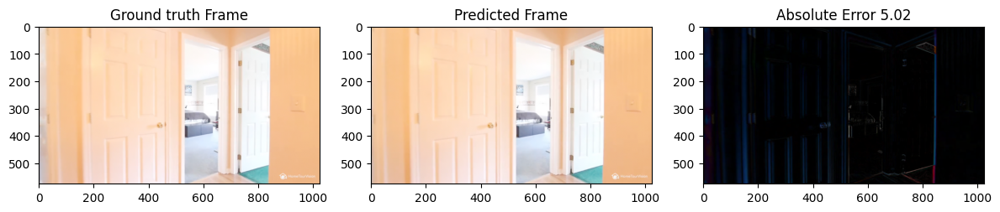

PSNR bw predicted and actual frame is 75.45822563096989
lpips bw predicted and actual frame is: Distance: 0.106



SCALE-2


Reconstructing Frame using Forward Optical Flow



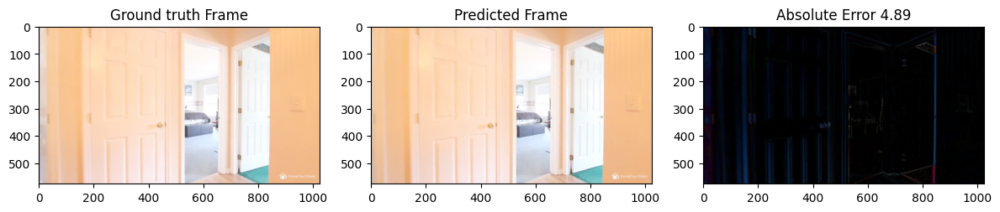

PSNR bw predicted and actual frame is 75.81555681369171
lpips bw predicted and actual frame is: Distance: 0.105



SCALE-4


Reconstructing Frame using Forward Optical Flow



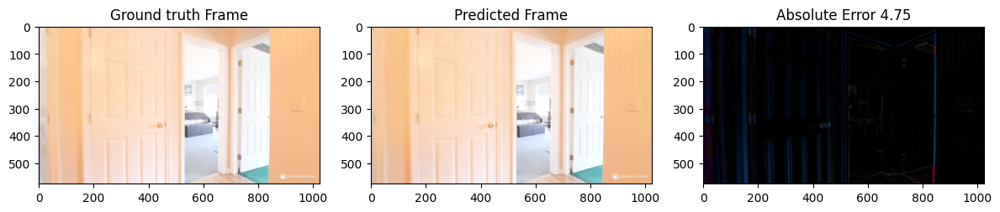

PSNR bw predicted and actual frame is 76.10690615090522
lpips bw predicted and actual frame is: Distance: 0.110



SCALE-8


Reconstructing Frame using Forward Optical Flow



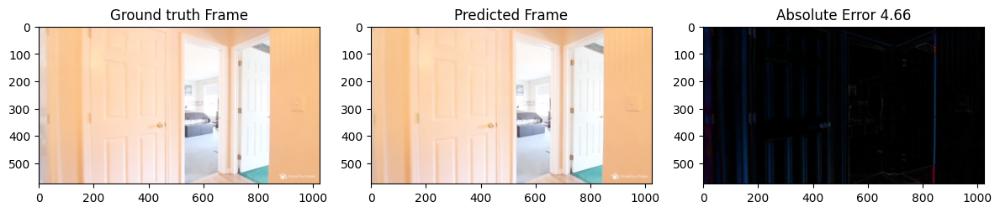

PSNR bw predicted and actual frame is 76.31209649360771
lpips bw predicted and actual frame is: Distance: 0.114



SCALE-16


Reconstructing Frame using Forward Optical Flow



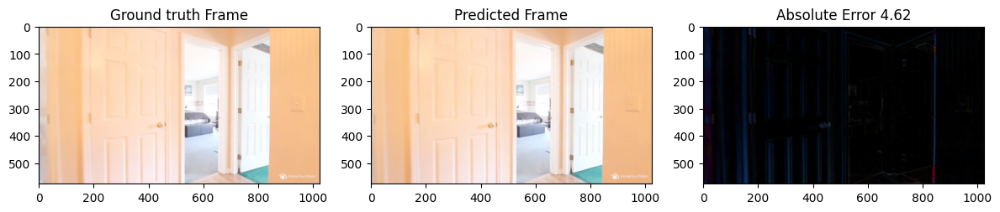

PSNR bw predicted and actual frame is 76.44572125539149
lpips bw predicted and actual frame is: Distance: 0.116



SCALE-32


Reconstructing Frame using Forward Optical Flow



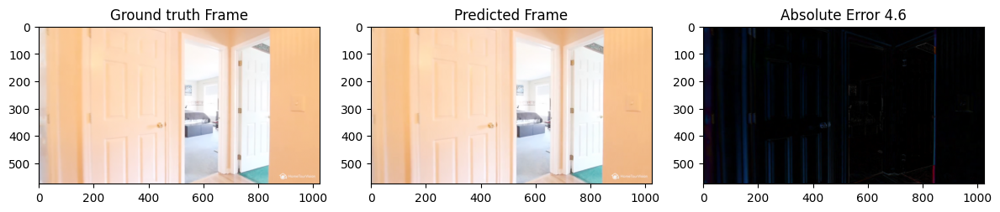

PSNR bw predicted and actual frame is 76.44063614757677
lpips bw predicted and actual frame is: Distance: 0.119



SCALE-64


Reconstructing Frame using Forward Optical Flow



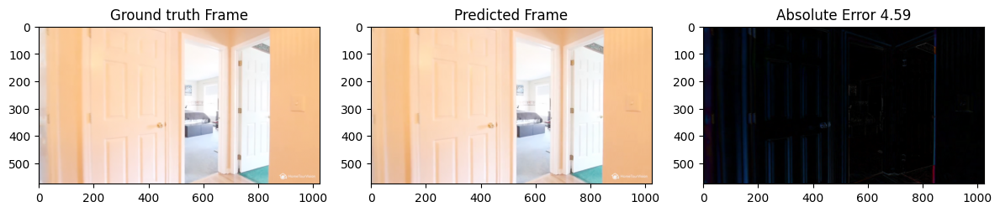

PSNR bw predicted and actual frame is 76.43106018446466
lpips bw predicted and actual frame is: Distance: 0.121





In [ ]:
print("SCALE-1")
aa,bb = MultiScaleOF(im1,im3,scale=1)
R = image_warping(im3, aa, bb)
plot_print(im1, im3, im1, R)              # frame, nxt_frame, interpolated frame (GT), Calculated
print("SCALE-2")

aa,bb = MultiScaleOF(im1,im3,scale=2)
R = image_warping(im3, aa, bb)
plot_print(im1, im3, im1, R)              # frame, nxt_frame, interpolated frame (GT), Calculated

print("SCALE-4")
aa,bb = MultiScaleOF(im1,im3,scale=4)
R = image_warping(im3, aa, bb)
plot_print(im1, im3, im1, R)              # frame, nxt_frame, interpolated frame (GT), Calculated

print("SCALE-8")
aa,bb = MultiScaleOF(im1,im3,scale=8)
R = image_warping(im3, aa, bb)
plot_print(im1, im3, im1, R)              # frame, nxt_frame, interpolated frame (GT), Calculated

print("SCALE-16")
aa,bb = MultiScaleOF(im1,im3,scale=16)
R = image_warping(im3, aa, bb)
plot_print(im1, im3, im1, R)              # frame, nxt_frame, interpolated frame (GT), Calculated

print("SCALE-32")
aa,bb = MultiScaleOF(im1,im3,scale=32)
R = image_warping(im3, aa, bb)
plot_print(im1, im3, im1, R)              # frame, nxt_frame, interpolated frame (GT), Calculated

print("SCALE-64")
aa,bb = MultiScaleOF(im1,im3,scale=64)
R = image_warping(im3, aa, bb)
plot_print(im1, im3, im1, R)              # frame, nxt_frame, interpolated frame (GT), Calculated